In [35]:
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

batch_size = 128
num_classes = 10
epochs = 12

# input image dimensions
img_rows, img_cols = 28, 28

# the data, split between train and test sets
(x_train, y_train), (x_test, y_test) = mnist.load_data()

if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

# convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=input_shape))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples
Train on 60000 samples, validate on 10000 samples
Epoch 1/12
60000/60000 [==============================] - 6s 97us/step - loss: 0.2613 - acc: 0.9184 - val_loss: 0.0601 - val_acc: 0.9810
Epoch 2/12
60000/60000 [==============================] - 5s 76us/step - loss: 0.0898 - acc: 0.9733 - val_loss: 0.0410 - val_acc: 0.9867
Epoch 3/12
60000/60000 [==============================] - 5s 80us/step - loss: 0.0666 - acc: 0.9798 - val_loss: 0.0350 - val_acc: 0.9882
Epoch 4/12
60000/60000 [==============================] - 5s 76us/step - loss: 0.0553 - acc: 0.9833 - val_loss: 0.0323 - val_acc: 0.9879
Epoch 5/12
60000/60000 [==============================] - 5s 75us/step - loss: 0.0469 - acc: 0.9861 - val_loss: 0.0292 - val_acc: 0.9890
Epoch 6/12
60000/60000 [==============================] - 5s 76us/step - loss: 0.0431 - acc: 0.9870 - val_loss: 0.0268 - val_acc: 0.9912
Epoch 7/12
60000/60000 [==============================]

In [3]:
!pip install foolbox

In [0]:
print(model.predict(x_test[28]))

(28, 28, 1)
(28, 28)
Original Image



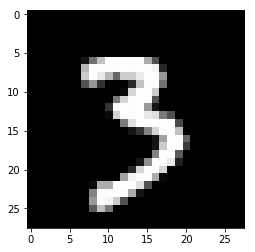

8
0.0243424
Prediction:  [[1.35649752e-04 3.23841727e-04 2.43423991e-02 1.91863754e-03
  1.06573025e-05 2.95132902e-02 2.00789407e-04 1.68088137e-03
  9.41780567e-01 9.33279371e-05]]


In [36]:
import foolbox
from foolbox.models import KerasModel
from foolbox.attacks import LBFGSAttack, SaliencyMapAttack, IterativeGradientAttack
from foolbox.attacks import DeepFoolAttack, BIM, GradientAttack, L1BasicIterativeAttack, L2BasicIterativeAttack
from foolbox.criteria import TargetClassProbability
import numpy as np
import matplotlib.pyplot as plt

import keras
from keras.applications.resnet50 import ResNet50
from keras.applications.resnet50 import preprocess_input
#from keras.applications.resnet50 import decode_predictions

#keras.backend.set_learning_phase(0)
#kmodel = ResNet50(weights='imagenet')
#fmodel = KerasModel(model, bounds=(0, 255), preprocessing=preprocessing)

#preprocessing = (np.array([104, 116, 123]), 1)

fmodel = KerasModel(model, bounds=(0, 255))

image = x_test[30] #Do not put test_img since it has been expanded
print(image.shape)
plot_img = image.reshape((28,28))
plot_img /= 255.
print(plot_img.shape)
plt.imshow(plot_img, cmap = 'gray')

from PIL import Image

im = Image.fromarray(plot_img.astype(np.uint8))
im.save("3_og.png")
print("Original Image\n")
plt.show()
label = 3

# run the attack
# attack = LBFGSAttack(model=fmodel, criterion=TargetClassProbability(8, p=.8))
# attack = IterativeGradientAttack(model=fmodel, criterion=TargetClassProbability(0, p=.8))
# attack = BIM(model=fmodel, criterion=TargetClassProbability(8, p=.9))
attack = L1BasicIterativeAttack(model=fmodel, criterion=TargetClassProbability(8, p=.9))
# attack = SaliencyMapAttack(model=fmodel, criterion=TargetClassProbability(4, p=.9))
# attack = GradientAttack(model=fmodel, criterion=TargetClassProbability(10, p=.5))

# attack = DeepFoolAttack(model=fmodel, criterion=TargetClassProbability(1, p=.2))

adversarial = attack(image, label) #image[:, :, ::-1] For BGR

# show results
print(np.argmax(fmodel.predictions(adversarial)))
print(foolbox.utils.softmax(fmodel.predictions(adversarial))[2])
adversarial_rgb = adversarial[np.newaxis, :] #image[:, :, ::-1] For BGR
preds = model.predict(adversarial_rgb)

print("Prediction: ", preds)

(1, 28, 28, 1)
[[2.9741597e-04 6.1729626e-04 1.7229752e-03 4.6356615e-02 8.4962749e-06
  1.7888147e-02 6.0416857e-04 6.4624508e-04 9.3182838e-01 3.0218533e-05]]


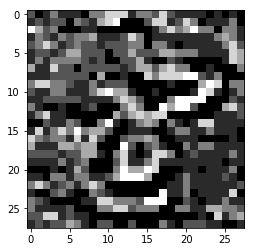

(28, 28)


<Figure size 432x288 with 0 Axes>

In [25]:
print(adversarial_rgb.shape)
# print(adversarial_rgb)
adv_img = adversarial_rgb
print(model.predict(adversarial_rgb))
# if(adv_img.shape == (28,28,1)):
#   adv_img = np.expand_dims(adv_img, axis=0)
# decode_predictions(model.predict(adv_img),1)

#decode_predictions(model.predict(adv_img,1))
adv_img = adv_img.reshape((28,28))
adv_img *= 255
# print(adv_img)
#adv_img = adv_img.astype(np.uint8)
plt.imshow(adv_img, cmap = 'gray')
plt.show()
plt.figure()
print(adv_img.shape)

#For Saving
adv_img = adv_img.astype(np.uint8)



1.   9.9724472e-01 LBFGS
2.  9.3182838e-01 BIM
3.   



In [0]:
from PIL import Image

im = Image.fromarray(adv_img)
im.save("3_hack_LBFGS.png")

from google.colab import files
# files.download("9_hack.png" )

(28, 28)


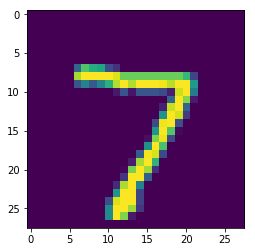

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.    

In [0]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
test_img = np.expand_dims(x_test[0], axis=0)
model.predict(test_img)

plot_img = x_test[0].reshape((28,28))
print(plot_img.shape)
plt.imshow(plot_img)
plt.show()

print(plot_img)

plot_img *= 255

im = Image.fromarray(plot_img.astype(np.uint8))
im.save("test_number.jpg")

from google.colab import files
files.download("test_number.jpg" ) 

#Hacking

(28, 28)


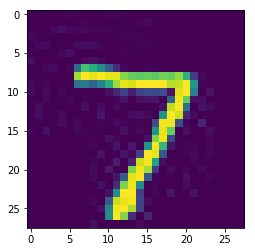

In [0]:
import numpy as np
from keras.preprocessing import image
#from keras.applications import inception_v3
from keras import backend as K
from PIL import Image

# Load pre-trained image recognition model
#model = inception_v3.InceptionV3()

# Grab a reference to the first and last layer of the neural net
model_input_layer = model.layers[0].input
model_output_layer = model.layers[-1].output

# Choose an ImageNet object to fake
# The list of classes is available here: https://gist.github.com/ageitgey/4e1342c10a71981d0b491e1b8227328b
# Class #859 is "toaster"
object_type_to_fake = 2

# Load the image to hack
img = image.load_img("test_number.jpg", color_mode = "grayscale", target_size=(28, 28)) 
original_image = image.img_to_array(img)

#print(original_image)

plot_img = original_image.reshape((28,28))
plot_img /= 255.
print(plot_img.shape)
plt.imshow(plot_img)
plt.show()

# Scale the image so all pixel intensities are between [-1, 1] as the model expects
original_image /= 255.
original_image -= 0.5
original_image *= 2.

#print(original_image)

# Add a 4th dimension for batch size (as Keras expects)
original_image = np.expand_dims(original_image, axis=0)

# Pre-calculate the maximum change we will allow to the image
# We'll make sure our hacked image never goes past this so it doesn't look funny.
# A larger number produces an image faster but risks more distortion.
max_change_above = original_image + 0.01
max_change_below = original_image - 0.01

# Create a copy of the input image to hack on
hacked_image = np.copy(original_image)

# How much to update the hacked image in each iteration
learning_rate = 0.01

# Define the cost function.
# Our 'cost' will be the likelihood out image is the target class according to the pre-trained model
cost_function = model_output_layer[0, object_type_to_fake]

# We'll ask Keras to calculate the gradient based on the input image and the currently predicted class
# In this case, referring to "model_input_layer" will give us back image we are hacking.
gradient_function = K.gradients(cost_function, model_input_layer)[0]

# Create a Keras function that we can call to calculate the current cost and gradient
grab_cost_and_gradients_from_model = K.function([model_input_layer, K.learning_phase()], [cost_function, gradient_function])

cost = 0.0



In [0]:
# In a loop, keep adjusting the hacked image slightly so that it tricks the model more and more
# until it gets to at least 80% confidence
while cost < 0.09:
    # Check how close the image is to our target class and grab the gradients we
    # can use to push it one more step in that direction.
    # Note: It's really important to pass in '0' for the Keras learning mode here!
    # Keras layers behave differently in prediction vs. train modes!
    cost, gradients = grab_cost_and_gradients_from_model([hacked_image, 0])

    # Move the hacked image one step further towards fooling the model
    hacked_image += gradients * learning_rate
    #print(cost, " : ", gradients)

    # Ensure that the image doesn't ever change too much to either look funny or to become an invalid image
    hacked_image = np.clip(hacked_image, max_change_below, max_change_above)
    hacked_image = np.clip(hacked_image, -1.0, 1.0)

    print("Model's predicted likelihood that the image is a toaster: {:.8}%".format(cost * 100))



Model's predicted likelihood that the image is a toaster: 8.2815848%
Model's predicted likelihood that the image is a toaster: 8.2821853%
Model's predicted likelihood that the image is a toaster: 8.2827233%
Model's predicted likelihood that the image is a toaster: 8.2832277%
Model's predicted likelihood that the image is a toaster: 8.2836904%
Model's predicted likelihood that the image is a toaster: 8.2841374%
Model's predicted likelihood that the image is a toaster: 8.2845643%
Model's predicted likelihood that the image is a toaster: 8.2849942%
Model's predicted likelihood that the image is a toaster: 8.285404%
Model's predicted likelihood that the image is a toaster: 8.285825%
Model's predicted likelihood that the image is a toaster: 8.2862131%
Model's predicted likelihood that the image is a toaster: 8.2866259%
Model's predicted likelihood that the image is a toaster: 8.2870193%
Model's predicted likelihood that the image is a toaster: 8.287403%
Model's predicted likelihood that the

(28, 28)


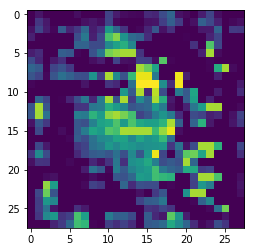

In [0]:
# De-scale the image's pixels from [-1, 1] back to the [0, 255] range
img = hacked_image[0]
img /= 2.
img += 0.5
img *= 255.

plot_img = img.reshape((28,28))
# plot_img /= 255.
print(plot_img.shape)
plt.imshow(plot_img)
plt.show()



# Save the hacked image!
# im = Image.fromarray(img.astype(np.uint8))
# im.save("hackedimgcat.png")

#End HAck

In [0]:
import numpy as np
from keras.preprocessing import image
from keras.applications import inception_v3
from keras import backend as K
from PIL import Image
import matplotlib.pyplot as plt

# Load the image to hack
img = image.load_img("hackedseven.png", color_mode = "grayscale", target_size=((28, 28)))
original_image = image.img_to_array(img)
print(original_image.shape)

# Scale the image so all pixel intensities are between [-1, 1] as the model expects
#original_image /= 255.
input_image -= 0.5
input_image *= 2.
original_image = np.expand_dims(original_image, axis=0)


model.predict(original_image)

FileNotFoundError: ignored

In [0]:
import numpy as np
from keras.preprocessing import image
#from keras.applications import inception_v3
from keras import backend as K
from PIL import Image
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D

batch_size = 128
num_classes = 10
epochs = 12

# input image dimensions
img_rows, img_cols = 28, 28

# the data, split between train and test sets
(x_train, y_train), (x_test, y_test) = mnist.load_data()

if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')


# Load pre-trained image recognition model
model_hack = Sequential()
model_hack.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=input_shape))
model_hack.add(Conv2D(64, (3, 3), activation='relu'))
model_hack.add(MaxPooling2D(pool_size=(2, 2)))
model_hack.add(Dropout(0.25))
model_hack.add(Flatten())
model_hack.add(Dense(128, activation='relu'))
model_hack.add(Dropout(0.5))
model_hack.add(Dense(num_classes, activation='softmax'))

model_hack.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

model_hack.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1)



x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples


ValueError: ignored

In [0]:
# Grab a reference to the first and last layer of the neural net
model_input_layer = model_hack.layers[0].input
model_output_layer = model_hack.layers[-1].output

# Choose an ImageNet object to fake
# The list of classes is available here: https://gist.github.com/ageitgey/4e1342c10a71981d0b491e1b8227328b
# Class #859 is "toaster"
object_type_to_fake = 3

# Load the image to hack
img = image.load_img("seven.png", target_size=(28, 28))
original_image = image.img_to_array(img)
# img = PIL.Image.open("foo.jpg")
# arr = numpy.array(img)

# Scale the image so all pixel intensities are between [-1, 1] as the model expects
original_image /= 255.
original_image -= 0.5
original_image *= 2.

# Add a 4th dimension for batch size (as Keras expects)
original_image = np.expand_dims(original_image, axis=0)

# Pre-calculate the maximum change we will allow to the image
# We'll make sure our hacked image never goes past this so it doesn't look funny.
# A larger number produces an image faster but risks more distortion.
max_change_above = original_image + 0.01
max_change_below = original_image - 0.01

# Create a copy of the input image to hack on
hacked_image = np.copy(original_image)

# How much to update the hacked image in each iteration
learning_rate = 0.2

# Define the cost function.
# Our 'cost' will be the likelihood out image is the target class according to the pre-trained model
cost_function = model_output_layer[0, object_type_to_fake]

# We'll ask Keras to calculate the gradient based on the input image and the currently predicted class
# In this case, referring to "model_input_layer" will give us back image we are hacking.
gradient_function = K.gradients(cost_function, model_input_layer)[0]

# Create a Keras function that we can call to calculate the current cost and gradient
grab_cost_and_gradients_from_model = K.function([model_input_layer, K.learning_phase()], [cost_function, gradient_function])

cost = 0.0

# In a loop, keep adjusting the hacked image slightly so that it tricks the model more and more
# until it gets to at least 80% confidence
while cost < 0.90:
    # Check how close the image is to our target class and grab the gradients we
    # can use to push it one more step in that direction.
    # Note: It's really important to pass in '0' for the Keras learning mode here!
    # Keras layers behave differently in prediction vs. train modes!
    cost, gradients = grab_cost_and_gradients_from_model([hacked_image, 0])

    # Move the hacked image one step further towards fooling the model
    hacked_image += gradients * learning_rate

    # Ensure that the image doesn't ever change too much to either look funny or to become an invalid image
    hacked_image = np.clip(hacked_image, max_change_below, max_change_above)
    hacked_image = np.clip(hacked_image, -1.0, 1.0)

    print("Model's predicted likelihood that the image is a toaster: {:.8}%".format(cost * 100))

# De-scale the image's pixels from [-1, 1] back to the [0, 255] range
img = hacked_image[0]
img /= 2.
img += 0.5
img *= 255.

# Save the hacked image!
im = Image.fromarray(img.astype(np.uint8))
im.save("hackedimgcat.png")

# CIFAR 100 Dataset

In [0]:
import _pickle as cPickle

In [0]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [0]:
from __future__ import print_function
import keras
from keras.datasets import cifar100
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D
import os

batch_size = 32
num_classes = 100
epochs = 100
data_augmentation = True
num_predictions = 20
save_dir = os.path.join(os.getcwd(), 'saved_models')
model_name = 'keras_cifar100_trained_model.h5'

In [0]:
(x_train, y_train), (x_test, y_test) = cifar100.load_data()
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

# Convert class vectors to binary class matrices.
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples


In [0]:
model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same',
                 input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes))
model.add(Activation('softmax'))

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
activation_7 (Activation)    (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 30, 30, 32)        9248      
_________________________________________________________________
activation_8 (Activation)    (None, 30, 30, 32)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 15, 15, 64)        18496     
__________

In [0]:
opt = keras.optimizers.rmsprop(lr=0.0001, decay=1e-6)

# Let's train the model using RMSprop
model.compile(loss='categorical_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

In [0]:
if not data_augmentation:
    print('Not using data augmentation.')
    model.fit(x_train, y_train,
              batch_size=batch_size,
              epochs=epochs,
              validation_data=(x_test, y_test),
              shuffle=True)
else:
    print('Using real-time data augmentation.')
    # This will do preprocessing and realtime data augmentation:
    datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        zca_epsilon=1e-06,  # epsilon for ZCA whitening
        rotation_range=0,  # randomly rotate images in the range (degrees, 0 to 180)
        # randomly shift images horizontally (fraction of total width)
        width_shift_range=0.1,
        # randomly shift images vertically (fraction of total height)
        height_shift_range=0.1,
        shear_range=0.,  # set range for random shear
        zoom_range=0.,  # set range for random zoom
        channel_shift_range=0.,  # set range for random channel shifts
        # set mode for filling points outside the input boundaries
        fill_mode='nearest',
        cval=0.,  # value used for fill_mode = "constant"
        horizontal_flip=True,  # randomly flip images
        vertical_flip=False,  # randomly flip images
        # set rescaling factor (applied before any other transformation)
        rescale=None,
        # set function that will be applied on each input
        preprocessing_function=None,
        # image data format, either "channels_first" or "channels_last"
        data_format=None,
        # fraction of images reserved for validation (strictly between 0 and 1)
        validation_split=0.0)

    # Compute quantities required for feature-wise normalization
    # (std, mean, and principal components if ZCA whitening is applied).
    datagen.fit(x_train)

    # Fit the model on the batches generated by datagen.flow().
    model.fit_generator(datagen.flow(x_train, y_train,
                                     batch_size=batch_size),
                        epochs=25, steps_per_epoch = 1000,
                        validation_data=(x_test, y_test))

Using real-time data augmentation.
Epoch 1/25
1000/1000 [==============================] - 16s 16ms/step - loss: 2.5084 - acc: 0.3652 - val_loss: 2.3273 - val_acc: 0.4057
Epoch 2/25
1000/1000 [==============================] - 17s 17ms/step - loss: 2.5122 - acc: 0.3674 - val_loss: 2.4042 - val_acc: 0.3940
Epoch 3/25
1000/1000 [==============================] - 17s 17ms/step - loss: 2.5108 - acc: 0.3652 - val_loss: 2.2614 - val_acc: 0.4150
Epoch 4/25
 634/1000 [==================>...........] - ETA: 6s - loss: 2.4995 - acc: 0.3654

KeyboardInterrupt: ignored

In [0]:
import tflearn
from tflearn.data_utils import shuffle, to_categorical
from tflearn.layers.core import input_data, dropout, fully_connected
from tflearn.layers.conv import conv_2d, max_pool_2d
from tflearn.layers.estimator import regression
from tflearn.data_preprocessing import ImagePreprocessing
from tflearn.data_augmentation import ImageAugmentation
import numpy as np

In [0]:
import _pickle as cPickle
def get_proper_images(raw):
    raw_float = np.array(raw, dtype=float) 
    images = raw_float.reshape([-1, 3, 32, 32])
    images = images.transpose([0, 2, 3, 1])
    return images

def onehot_labels(labels):
    return np.eye(100)[labels]

def unpickle(file):
    
    fo = open(file, 'rb')
    dict = cPickle.load(fo)
    fo.close()
    return dict

In [0]:
X = get_proper_images(unpickle('cifar-100-python/train')['data'])
Y = onehot_labels(unpickle('cifar-100-python/train')['fine_labels'])
X_test = get_proper_images(unpickle('cifar-100-python/test')['data'])
Y_test = onehot_labels(unpickle('cifar-100-python/test')['fine_labels'])

FileNotFoundError: ignored

In [0]:
img_prep = ImagePreprocessing()
img_prep.add_featurewise_zero_center()
img_prep.add_featurewise_stdnorm()


In [0]:
# Real-time data augmentation
img_aug = ImageAugmentation()
img_aug.add_random_flip_leftright()
img_aug.add_random_rotation(max_angle=15.)
#img_aug.add_random_crop((28, 28))
#img_aug.add_random_blur(sigma_max=5.0)

In [0]:
# Convolutional network building
network = input_data(shape=[None, 32, 32, 3])
network = conv_2d(network, 32, 3, strides=1, padding='same', activation='relu', bias=True, 
                  bias_init='zeros', weights_init='uniform_scaling')
network = max_pool_2d(network, 2 , strides=None, padding='same')
network = conv_2d(network, 64, 3, strides=1, padding='same', activation='relu', bias=True, 
                  bias_init='zeros', weights_init='uniform_scaling')
network = conv_2d(network, 64, 3 , strides=1, padding='same', activation='relu', bias=True, 
                  bias_init='zeros', weights_init='uniform_scaling')
network = max_pool_2d(network, 2 , strides=None, padding='same')
network = fully_connected(network, 600, activation='relu')
network = dropout(network, 0.5)
network = fully_connected(network, 100, activation='softmax')
network = regression(network, optimizer='adam',
                     loss='categorical_crossentropy',
                     learning_rate=0.001)

Instructions for updating:
Use tf.initializers.variance_scaling instead with distribution=uniform to get equivalent behavior.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [0]:
# Train using classifier
model = tflearn.DNN(network, tensorboard_verbose=0)
model.fit(X, Y, n_epoch=50, shuffle=True, validation_set=(X_test, Y_test),
          show_metric=True, batch_size=100 , run_id="withoutaugpre")

Instructions for updating:
Use tf.cast instead.


NameError: ignored

In [0]:
import keras
from keras.models import Sequential
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Activation, Flatten, Dropout, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras.datasets import cifar10
from keras import regularizers
from keras.callbacks import LearningRateScheduler
import numpy as np
 
def lr_schedule(epoch):
    lrate = 0.001
    if epoch > 75:
        lrate = 0.0005
    if epoch > 100:
        lrate = 0.0003
    return(lrate)

(x_train, y_train), (x_test, y_test) = cifar10.load_data()
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
 
#z-score
# mean = np.mean(x_train,axis=(0,1,2,3))
# std = np.std(x_train,axis=(0,1,2,3))
# x_train = (x_train-mean)/(std+1e-7)
# x_test = (x_test-mean)/(std+1e-7)
 
num_classes = 10
y_train = np_utils.to_categorical(y_train,num_classes)
y_test = np_utils.to_categorical(y_test,num_classes)
 
weight_decay = 1e-4
model = Sequential()
model.add(Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay), input_shape=x_train.shape[1:]))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))
 
model.add(Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.3))
 
model.add(Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.4))
 
model.add(Flatten())
model.add(Dense(num_classes, activation='softmax'))
 
model.summary()
 
#data augmentation
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    )
datagen.fit(x_train)
 
#training
batch_size = 64
 
opt_rms = keras.optimizers.rmsprop(lr=0.001,decay=1e-6)
model.compile(loss='categorical_crossentropy', optimizer=opt_rms, metrics=['accuracy'])
model.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),\
                    steps_per_epoch=x_train.shape[0] // batch_size,epochs=10,\
                    verbose=1,validation_data=(x_test,y_test),callbacks=[LearningRateScheduler(lr_schedule)])
#save to disk
model_json = model.to_json()
with open('model.json', 'w') as json_file:
    json_file.write(model_json)
model.save_weights('model.h5') 
 
#testing
scores = model.evaluate(x_test, y_test, batch_size=128, verbose=1)
print('\nTest result: %.3f loss: %.3f' % (scores[1]*100,scores[0]))

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_33 (Conv2D)           (None, 32, 32, 32)        896       
_________________________________________________________________
activation_37 (Activation)   (None, 32, 32, 32)        0         
_________________________________________________________________
batch_normalization_19 (Batc (None, 32, 32, 32)        128       
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 32, 32, 32)        9248      
_________________________________________________________________
activation_38 (Activation)   (None, 32, 32, 32)        0         
_________________________________________________________________
batch_normalization_20 (Batc (None, 32, 32, 32)        128       
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 16, 16, 32)        0         
__________

In [0]:
print(x_test[5].shape)
test_image = np.expand_dims(x_test[5], axis=0)
model.predict(test_image)

(32, 32, 3)


array([[6.5031642e-08, 1.6155500e-06, 2.3608705e-05, 4.2915053e-04,
        2.2446060e-04, 2.8302686e-05, 9.9927109e-01, 1.1391546e-06,
        1.1143947e-05, 9.2955270e-06]], dtype=float32)

[[[179 118  83]
  [139  96  61]
  [ 77  49  26]
  ...
  [ 87  53  46]
  [ 76  47  41]
  [ 77  47  41]]

 [[184 130  97]
  [133  88  53]
  [128  89  58]
  ...
  [ 98  61  53]
  [ 91  58  51]
  [ 90  57  49]]

 [[180 132 100]
  [152 104  71]
  [176 129  92]
  ...
  [101  62  53]
  [ 93  56  47]
  [ 95  57  49]]

 ...

 [[142  73  61]
  [149  84  75]
  [144  81  73]
  ...
  [119  68  56]
  [139  87  78]
  [159 100  89]]

 [[152  83  70]
  [166  96  81]
  [179 106  90]
  ...
  [131  77  65]
  [144  87  77]
  [153  90  79]]

 [[159  92  79]
  [178 107  93]
  [183 113  95]
  ...
  [150  90  76]
  [153  91  79]
  [152  87  73]]]
(32, 32, 3)


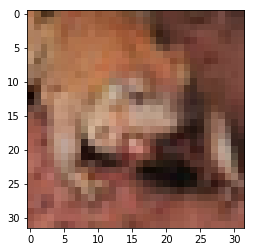

In [0]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

image_t = x_test[5].astype(np.uint8)

plot_img = image_t.reshape((32,32,3))
print(plot_img.shape)
plt.imshow(plot_img)
plt.show()

im = Image.fromarray(plot_img.astype('uint8'))
im.save("test_frog.png")

from google.colab import files
files.download("test_frog.png" ) 